# Exercise 12

Georgina Gomes GMSGEO001

# The diffusion equation
Numerical solution of the 1D diffusion problem
$$ \frac{\partial N}{\partial t} =  k \frac{\partial^2 N}{\partial x^2}$$ 
using an explicit scheme

$N(x,t)$ represents the evolution of the dissolved nitrogen (DIN) concentration along the estuary over time

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
# constants
SECPERDAY = 86400.
M2KM = 1000

## Shape function and grid setup function
The initial shape of the temperature distribution is a Gaussian peak function

In [2]:
# Spatial shape of the initial DIN concentration
def Gaussian(x):
    y = N0+A*np.exp(-(x/sigma)**2)
    return y

The resulting space-time grid depends on the parameters above. The non-dimensional Courant number must be smaller than 0.5 for conditional stability.

In [3]:
def setup_grid_axis(tmax, dt, xmax, dx):
    # time axis
    NT = int(np.floor(tmax*SECPERDAY/dt))+1  # number of steps (starts from 0)
    # X axis (centred at 0)
    x = np.arange(-xmax,xmax,dx)
    IM = len(x)             # number of grid points
    N = np.zeros([IM,NT])   # the array holding the numerical solution 
    print('Grid steps : ',IM)
    print('Number of time steps : ',NT)
    print('Timestep = ',dt,' s')
    print('Max numerical diffusion DX^2/DT = ',dx**2/dt,' m2/s')
    print('Physical diffusion = ',kappa,' m2/s')
    print('Courant number (diffusion) = ',kappa*dt/(dx**2))
    return NT, x, N

## Numerical Solution function

In [4]:
def compute_diffusion_numerical_solution(x, dx, NT, dt, kappa, N, Gaussian, boundary_condition_type):
        # Compute the numerical solution using a time loop over the number of time steps
    N[:,0] = Gaussian(x)    # initial condition
    
    for n in range(NT-1):
        if boundary_condition_type == 'neumann':
            N[0,n+1]  = N[1,n]    #Neumann boundary conditions
            N[-1,n+1] = N[-2,n]   #Neumann boundary conditions
        elif boundary_condition_type == 'dirichlet':
            N[0,n+1]  = N0   #Dirichlet boundary conditions   
            N[-1,n+1] = N0   #Dirichlet boundary conditions
        else:
            print("Missing boundary_condition_type")
        # discretization of the second derivative
        rhs = kappa*(N[:-2,n]-2*N[1:-1,n]+N[2:,n])/(dx**2)
        N[1:-1,n+1] = N[1:-1,n] + rhs*dt
    return N     

## Matplotlib animation of result function

In [5]:
def plot_animation_comparison(tmax, dt, xmax, dx, kappa, Gaussian, boundary_condition_type):
    
    NT, x, N = setup_grid_axis(tmax, dt, xmax, dx)

    N = compute_diffusion_numerical_solution(x, dx, NT, dt, kappa, N, Gaussian, boundary_condition_type)
    
    fig, ax = plt.subplots()
    # set the axis limits
    plt.axis([-xmax/M2KM, xmax/M2KM, N0-5, N0+A+10])
    # first plot the initial condition and set the line attributes
    sol, = ax.plot(x/M2KM, N[:,0],'m',label='numerical')
    line, = ax.plot(x/M2KM, Gaussian(x),'k',label='initial')
    ax.set_xlabel('X (km)')
    ax.set_ylabel('DIN ($mmol N m^{-3}$)')
    plt.legend(loc='upper left')
    
    def animate(i):
        sol.set_ydata(N[:,i])  # update the numerical solution
        return sol,
    
    # create the animation and loop (interval is in ms)
    ani = animation.FuncAnimation(
        fig, animate, interval=dt, blit=True, frames=NT, repeat=True)
    
    # display the animation as a javascript object embedded in the notebook
    from IPython.display import HTML
    return HTML(ani.to_jshtml())

Grid steps :  40
Number of time steps :  104
Timestep =  100  s
Max numerical diffusion DX^2/DT =  2500.0  m2/s
Physical diffusion =  1000.0  m2/s
Courant number (diffusion) =  0.4


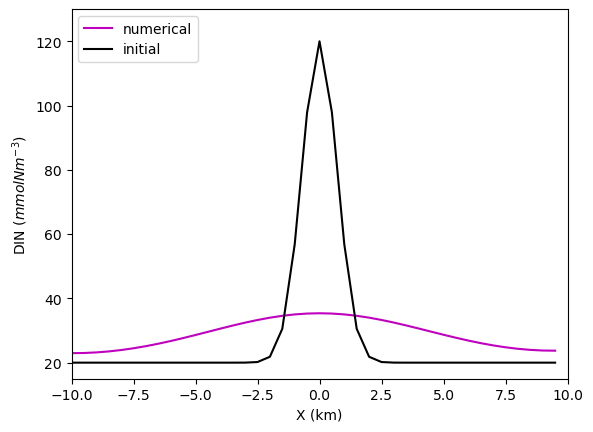

In [6]:
# problem parameters
kappa=1.0e3   # Eddy diffusion coefficient [m2 s-1]
dx=500         # X resolution [m]
dt=100         # time step [s]
t0=0.          # initial time
tmax=0.12      # duration of simulation [days]
xmax=10.0e3    # length of the basin [m]

# Parameters of the initial DIN spillage
N0 = 20.       # baseline concentration [mmol/m3]
sigma = 1000.  # width [m]
A = 100.       # amplitude [mmol/m3]

plot_animation_comparison(tmax, dt, xmax, dx, kappa, Gaussian, "neumann")

# Question 1: Why does the flattening of the peak slow down with time in the numerical solution?
This is because the DIN concentration gradient decreases over time as the most potent pollutant diffuses rapidly initially when the gradient is highest and this diffusion gets slower and slower as the gradient becomes less and less, since the concentration gradient is what directly drives diffusion.

# Question 2: Neumann boundary conditions, how would you describe them?

## Animation with Neumann boundary conditions vs Dirichlet:

Grid steps :  40
Number of time steps :  104
Timestep =  100  s
Max numerical diffusion DX^2/DT =  2500.0  m2/s
Physical diffusion =  1000.0  m2/s
Courant number (diffusion) =  0.4


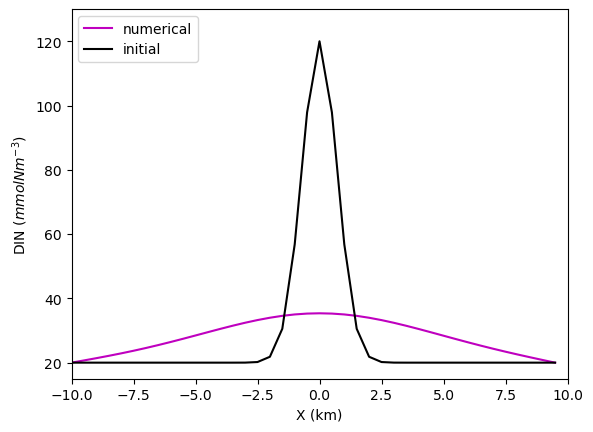

In [7]:
plot_animation_comparison(tmax, dt, xmax, dx, kappa, Gaussian, "dirichlet")

**Why do you think the Neumann boundary conditions are more realistic?**
In terms of the physical process of diffusion, the neumann boundary conditions illustrate what we would expect to happen better; over time the points at the boundary, their DIN concentration should increase above baseline becasue the pollutant has diffused over time to the furthest point. In the Dirichlet animation, the boundary values do not move from baseline which is not realistic, the dirichlet boundary conditions do not suggest the system is trying to reach equilibrium ie eventually a flat line since the shape is concave rather than properly flattening by lifting the edges like the neumann case.

# Question 3: What happens if you double the eddy diffusivity coefficient?

Grid steps :  40
Number of time steps :  104
Timestep =  100  s
Max numerical diffusion DX^2/DT =  2500.0  m2/s
Physical diffusion =  2000.0  m2/s
Courant number (diffusion) =  0.8


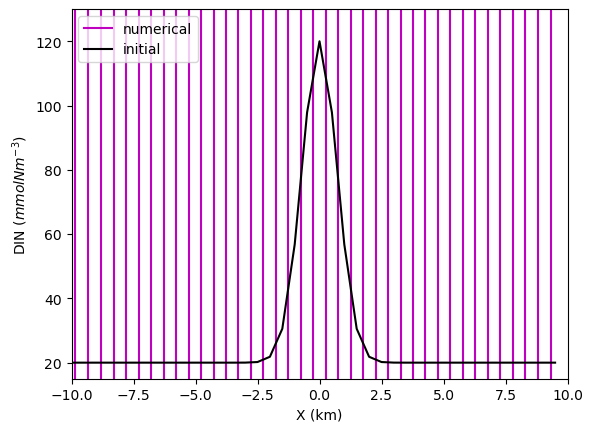

In [8]:
# double eddy diffusivity coefficient
kappa=(1.0e3)*2   # Eddy diffusion coefficient [m2 s-1]

plot_animation_comparison(tmax, dt, xmax, dx, kappa, Gaussian, "neumann")

When the diffusivity coefficient is doubled, the animation shows that the solution becomes unstable, the courant number goes up to 0.8 and the solution appears to "explode".

## What would you do to fix it and why?

To fix this, we want the courant number to be back in the stable zone of 0.5 or less, so we can change  kappa, dt, and dx to get the courant number back to stability.

Grid steps :  20
Number of time steps :  104
Timestep =  100  s
Max numerical diffusion DX^2/DT =  10000.0  m2/s
Physical diffusion =  2000.0  m2/s
Courant number (diffusion) =  0.2


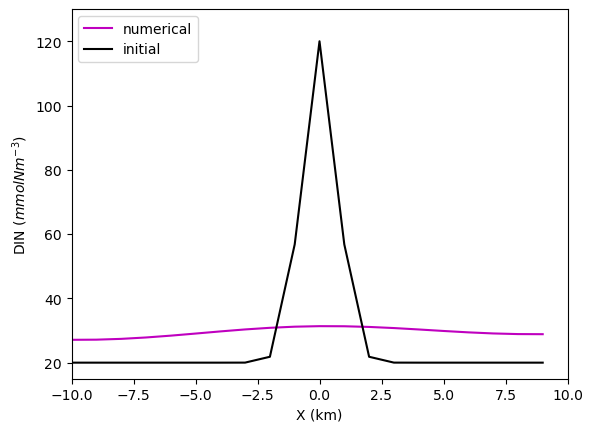

In [9]:
# problem parameters
kappa=(1.0e3)*2   # Eddy diffusion coefficient [m2 s-1]
dx=1000         # X resolution [m]
dt=100         # time step [s]
t0=0.          # initial time
tmax=0.12      # duration of simulation [days]
xmax=10.0e3    # length of the basin [m]

# Parameters of the initial DIN spillage
N0 = 20.       # baseline concentration [mmol/m3]
sigma = 1000.  # width [m]
A = 100.       # amplitude [mmol/m3]

plot_animation_comparison(tmax, dt, xmax, dx, kappa, Gaussian, "neumann")

Doubling dx, brings the numerical solution back to a stable state when kappa is doubled.